![](https://media.giphy.com/media/tWRJEZeQeHAqs/giphy.gif)

<body>
    <font size=6 color="red">Background checkup</font>
</body>
 

The basic idea of analyzing the Zomato dataset is to get a fair idea about the factors affecting the establishment of different types of restaurant at different places in Bengaluru, aggregate rating of each restaurant, Bengaluru being one such city has more than 12,000 restaurants with restaurants serving dishes from all over the world. With each day new restaurants opening the industry has’nt been saturated yet and the demand is increasing day by day. Inspite of increasing demand it however has become difficult for new restaurants to compete with established restaurants. Most of them serving the same food. Bengaluru being an IT capital of India. Most of the people here are dependent mainly on the restaurant food as they don’t have time to cook for themselves. With such an overwhelming demand of restaurants it has therefore become important to study the demography of a location.

- What kind of a food is more popular in a locality. 
- Do the entire locality loves vegetarian food. If yes then is that locality populated by a particular sect of people for eg. Jain, Marwaris, Gujaratis who are mostly vegetarian. These kind of analysis can be done using the data, by studying the factors such as • Location of the restaurant • Approx Price of food  Theme based restaurant or not 
-  Which locality of that city serves that cuisines with maximum number of restaurants • The needs of people who are striving to get the best cuisine of the neighborhood • Is a particular neighborhood famous for its own kind of food.

<font size=5 color="violet">If you like my work,please consider <font color='red'>upvoting</font> my kernel.</font>

<font size=5 color='blue'> What is in this kernel</font>

1. [Loading required libraries](#1)
2. [Getting basic ideas about the data](#2)
3. [Exploratory data analysis](#3)

     1. [ Which are the top restaurant chains in Bangaluru?](#4)
     2. [How many of the restuarants do not accept online orders?](#5)
     3. [What is the ratio b/w restaurants that provide and do not provide table booking ?](#25)
     4. [ Rating distribution](#6)
     5. [Is there any difference b/w votes of restaurants accepting and not accepting online orders?](#7)
     6. [Which are the most common restaurant type in Banglore?](#8)
     7. [Cost factor ?](#9)
     8. [Which are the foodie areas?](#10)
     9. [Which are the most common cuisines in each locations?](#11)
     10. [Extracting location information using Geopy](#12)
     11. [Heatmap of restaurant count on each location](13)
     12. [Which are  the most popular cuisines of Bangalore?](#14)
     13. [Heatmap of North Indian restaurants](#15)
     14. [What about South  Indian cuisines?](#16)
     15. [Analysing Restaurant chains ](#17)
            16. [Which are the most popular casual dining restaurant chains?](#18)
                   1. [Where are their outlets located?](#19)
            17. [Top quick bites restaurant chains in Banglore](#20)
                   1. [Where are their outlets located?](#21)
            18. [Top Cafes of Banglore?](#22)
                   1. [Where are their outlets located?](#23)
            19. [Wordcloud of dishes liked by cuisines.](#24)
     20. [Analysing Reviews](#26)
            21. [Wordcloud of restaurant reviews](#27)
            22. [Rating distribution](#28)
4. [Topic modelling](#33)
     23. [Topic modelling for positive comments](#34)
     24. [Topic modelling for positive comments](#35)
         
            
5. [Sentimental Analysis on Reviews](#29)
     23. [Data preparation](#30)
     24. [Building our model](#31)
     25. [Validation](#32)
     

## [Loading libraries]()<a id="1"></a> <br>


In [2]:
import numpy as np 
import pandas as pd
import os
import seaborn as sns
# print(os.listdir("../input"))
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=False)
from wordcloud import WordCloud
from geopy.geocoders import Nominatim
from folium.plugins import HeatMap
import folium
from tqdm import tqdm
import re
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D
from sklearn.model_selection import train_test_split
from nltk import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
import gensim
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.colors as mcolors
from sklearn.manifold import TSNE
from gensim.models import word2vec
import nltk
# Any results you write to the current directory are saved as output.

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
df=pd.read_csv("/content/drive/My Drive/Colab Datasets/zomato.csv")

## [Getting Basic Ideas]()<a id="2"></a> <br>


In [5]:
print("dataset contains {} rows and {} columns".format(df.shape[0],df.shape[1]))

dataset contains 51717 rows and 17 columns


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [7]:
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


**Columns description**

- **url**
contains the url of the restaurant in the zomato website

- **address**
contains the address of the restaurant in Bengaluru

- **name**
contains the name of the restaurant

- **online_order**
whether online ordering is available in the restaurant or not

- **book_table**
table book option available or not

- **rate**
contains the overall rating of the restaurant out of 5

- **votes**
contains total number of rating for the restaurant as of the above mentioned date

- **phone**
contains the phone number of the restaurant

- **location**
contains the neighborhood in which the restaurant is located

- **rest_type**
restaurant type

- **dish_liked**
dishes people liked in the restaurant

- **cuisines**
food styles, separated by comma

- **approx_cost(for two people)**
contains the approximate cost for meal for two people

- **reviews_list**
list of tuples containing reviews for the restaurant, each tuple 

- **menu_item**
contains list of menus available in the restaurant

- **listed_in(type)**
type of meal

- **listed_in(city)**
contains the neighborhood in which the restaurant is listed


## [Exploratory data analysis](#3)

## [Which are the top restaurant chains in Bangaluru?]()<a id="4"></a> <br>


In [8]:
df['name'].value_counts()[:20]

Cafe Coffee Day      96
Onesta               85
Just Bake            73
Empire Restaurant    71
Five Star Chicken    70
Kanti Sweets         68
Petoo                66
Polar Bear           65
Baskin Robbins       64
Chef Baker's         62
Pizza Hut            62
KFC                  60
Sweet Truth          60
Subway               60
Beijing Bites        60
Domino's Pizza       60
McDonald's           59
Smoor                59
Chai Point           58
Faasos               57
Name: name, dtype: int64

Text(0.5, 0, 'Number of outlets')

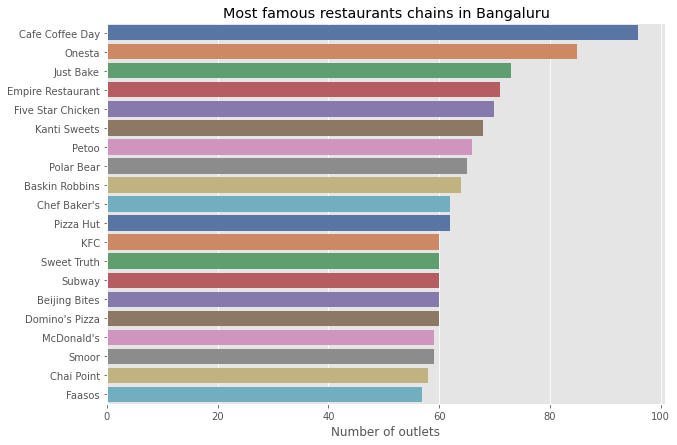

In [9]:
plt.figure(figsize=(10,7))
chains=df['name'].value_counts()[:20]

# chains.index gives the name of the restaurants.
sns.barplot(x=chains,y=chains.index, palette = 'deep')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets")

- As you can see **Cafe coffee day,Onesta,Just Bake** has the most number of outlets in and around bangalore.
- This is rather interesting,we will inspect each of them later.

In [0]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

## [How many of the restuarants do not accept online orders?]()<a id="5"></a> <br>


In [0]:
# df['online_order'].value_counts()['Yes']

In [12]:
configure_plotly_browser_state()
x=df['online_order'].value_counts()
colors = ['#FEBFB3', '#E1396C']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Accepting vs not accepting online orders",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
# fig.show()

1. As clearly indicated,almost 60 per cent of restaurants in Banglore accepts online orders.
2. Nearly 40 per cent of the restaurants do not accept online orders.
3. This might be because of the fact that these restaurants cannot afford to pay commission to zomoto for giving them orders online.
   zomato may want to consider giving them some more benefits if they want to increse the number of restaurants serving their customers online.


## [What is the ratio b/w restaurants that provide and do not provide table booking ?]()<a id="25"></a> <br>



In [13]:
configure_plotly_browser_state()
x=df['book_table'].value_counts()
colors = ['#96D38C', '#D0F9B1']

trace=go.Pie(labels=x.index,values=x,textinfo="value",
            marker=dict(colors=colors, 
                           line=dict(color='#000000', width=2)))
layout=go.Layout(title="Table booking",width=500,height=500)
fig=go.Figure(data=[trace],layout=layout)
py.iplot(fig, filename='pie_chart_subplots')
    

1. Almost 90 percent of restaurants in Banglore do not provide table booking facility.
2. In India you cannot find table booking facility in any average restaurants,usually only five star restaurants provides table booking.
3. We will inspect this further.

## [Rating distribution]()<a id="6"></a> <br>


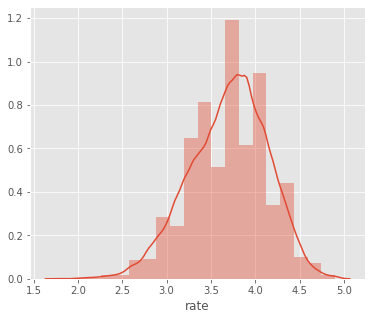

In [14]:
plt.figure(figsize=(6,5))
rating=df['rate'].dropna().apply(lambda x : float(x.split('/')[0]) if (len(x)>3)  else np.nan ).dropna()
sns.distplot(rating,bins=20)

1. Almost more than 50 percent of restaurants has rating between 3 and 4.
2. Restaurants having rating more than 4.5 are very rare.

In [0]:
cost_dist=df[['rate','approx_cost(for two people)','online_order']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))

## [Cost vs rating]()

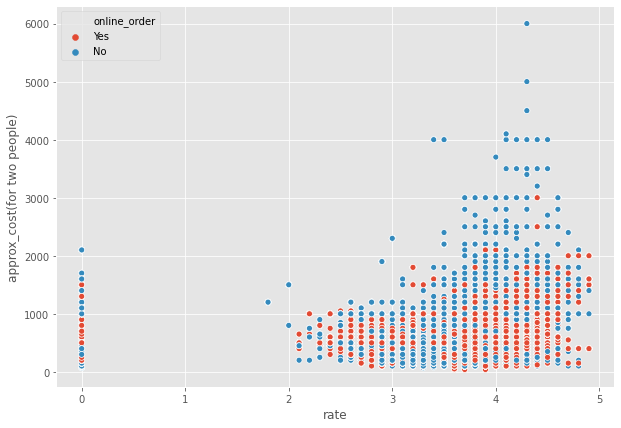

In [16]:
plt.figure(figsize=(10,7))
sns.scatterplot(x="rate",y='approx_cost(for two people)',hue='online_order',data=cost_dist)
plt.show()

### [Distribution of cost for two people]()

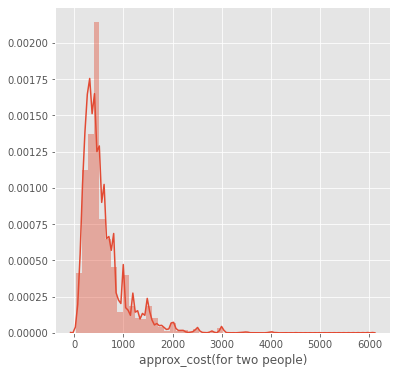

In [17]:
plt.figure(figsize=(6,6))
sns.distplot(cost_dist['approx_cost(for two people)'])
plt.show()

- We can see that the distribution if left skewed.
- This means almost 90percent of restaurants serve food for budget less than 1000 INR.($15)

## [Is there any difference b/w votes of restaurants accepting and not accepting online orders?]()<a id="7"></a> <br>


In [18]:
configure_plotly_browser_state()
votes_yes=df[df['online_order']=="Yes"]['votes']
trace0=go.Box(y=votes_yes,name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))

votes_no=df[df['online_order']=="No"]['votes']
trace1=go.Box(y=votes_no,name="Not accepting online orders",
              marker = dict(
        color = 'rgb(0, 128, 128)',
    ))

layout = go.Layout(
    title = "Box Plots of votes",width=800,height=500
)

data=[trace0,trace1]
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)

1. Yes,you can observe that median number of votes for both categories vary.
2. Restaurants accepting online orders tend to get more votes from customers as there is a rating option poping up after each order through zomato application.

## [Which are the most common restaurant type in Banglore?]()<a id="8"></a> <br>


Text(0.5, 0, 'count')

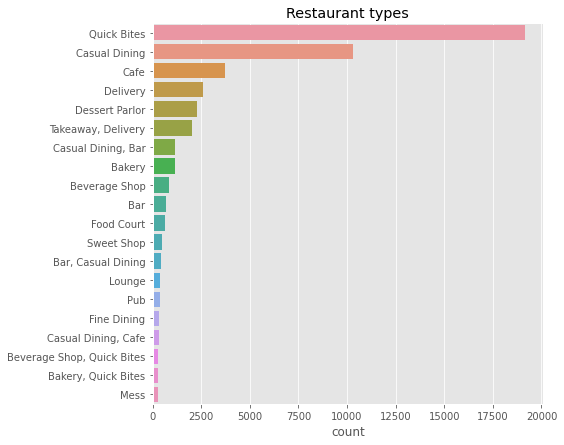

In [19]:
plt.figure(figsize=(7,7))
rest=df['rest_type'].value_counts()[:20]
sns.barplot(rest,rest.index)
plt.title("Restaurant types")
plt.xlabel("count")

1. No doubt about this as Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.
2. We can observe tha Quick Bites type restaurants dominates.

## [Cost factor ?]()<a id="9"></a> <br>


In [20]:
configure_plotly_browser_state()
trace0=go.Box(y=df['approx_cost(for two people)'],name="accepting online orders",
              marker = dict(
        color = 'rgb(214, 12, 140)',
    ))
data=[trace0]
layout=go.Layout(title="Box plot of approximate cost",width=800,height=500,yaxis=dict(title="Price"))
fig=go.Figure(data=data,layout=layout)
py.iplot(fig)

1. The median approximate cost for two people is 400 for a single meal.
2. 50 percent of restaurants charge between 300 and 650 for single meal for two people.


### [Finding Best budget Restaurants in any location]()

- I have implemented a simple filtering mechanism to find best budget restaurants in any locations in Bangalore.
- You can pass location and restaurant type as parameteres,function will return name of restaurants.


In [0]:
cost_dist=df[['rate','approx_cost(for two people)','location','name','rest_type']].dropna()
cost_dist['rate']=cost_dist['rate'].apply(lambda x: float(x.split('/')[0]) if len(x)>3 else 0)
cost_dist['approx_cost(for two people)']=cost_dist['approx_cost(for two people)'].apply(lambda x: int(x.replace(',','')))

In [0]:
def return_budget(location,rest):
    budget=cost_dist[(cost_dist['approx_cost(for two people)']<=400) & (cost_dist['location']==location) & 
                     (cost_dist['rate']>4) & (cost_dist['rest_type']==rest)]
    return(budget['name'].unique())

In [23]:
return_budget('BTM',"Quick Bites")

array(['Swadista Aahar', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Chaatimes', "Muthashy's", 'Swad Punjab Da',
       "Domino's Pizza", 'Roti Wala', 'Andhra Kitchen'], dtype=object)

## [Which are the foodie areas?]()<a id="10"></a> <br>


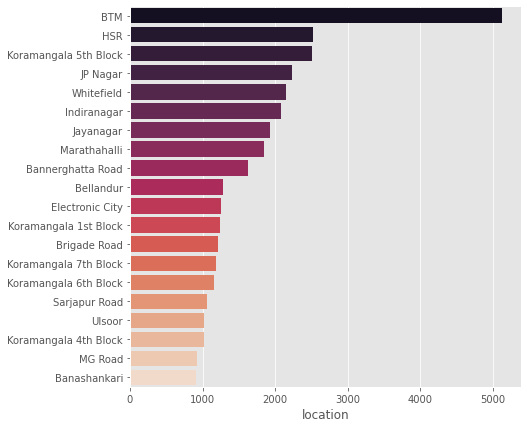

In [24]:
plt.figure(figsize=(7,7))
Rest_locations=df['location'].value_counts()[:20]
sns.barplot(Rest_locations,Rest_locations.index,palette="rocket")

1. We can see that **BTM,HSR and Koranmangala 5th block** has the most number of restaurants.
2. BTM dominates the section by having more than 5000 restaurants.

## [Which are the most common cuisines in each locations?]()<a id="11"></a> <br>


In [0]:
df_1=df.groupby(['location','cuisines']).agg('count')
data=df_1.sort_values(['url'],ascending=False).groupby(['location'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [26]:
data.head(10)

,level_0,location,cuisines,count
0,0,BTM,"North Indian, Chinese",379
1,0,BTM,North Indian,340
2,0,BTM,Biryani,120
3,1,Banashankari,South Indian,86
4,1,Banashankari,"North Indian, Chinese",61
5,1,Banashankari,North Indian,36
6,2,Banaswadi,South Indian,37
7,2,Banaswadi,"North Indian, Chinese",24
8,2,Banaswadi,Biryani,23
9,3,Bannerghatta Road,"North Indian, Chinese",130


## [Extracting location information using Geopy]()<a id="12"></a> <br>


In [0]:
locations=pd.DataFrame({"Name":df['location'].unique()})
locations['Name']=locations['Name'].apply(lambda x: "Bangalore " + str(x))
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in locations['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)


locations['geo_loc']=lat_lon
locations.to_csv('locations.csv',index=False)

In [29]:
locations["Name"]=locations['Name'].apply(lambda x :  x.replace("Bangalore","")[1:])
locations.head()

,Name,geo_loc
0,Banashankari,"(12.9152208, 77.573598)"
1,Basavanagudi,"(12.9417261, 77.5755021)"
2,Mysore Road,"(12.5523878, 76.9685867)"
3,Jayanagar,"(12.9292731, 77.5824229)"
4,Kumaraswamy Layout,"(12.906816899999999, 77.56352473621337)"


- We have found out latitude and longitude of each location listed in the dataset using geopy.
- This is used to plot maps.

## [Heatmap of restaurant count on each location]()<a id="13"></a> <br>


In [30]:
Rest_locations=pd.DataFrame(df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations=Rest_locations.merge(locations,on='Name',how="left").dropna()
Rest_locations['count'].max()

5124

In [0]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

In [32]:
lat,lon=zip(*np.array(Rest_locations['geo_loc']))
Rest_locations['lat']=lat
Rest_locations['lon']=lon
basemap=generateBaseMap()
HeatMap(Rest_locations[['lat','lon','count']].values.tolist(),max_zoom=20,radius=15).add_to(basemap)

In [0]:
HeatMap??

In [34]:
basemap

1. It is clear that restaurants tend to concentrate in central bangalore area.
2. The clutter of restaurants lowers are we move away from central.
3. So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

## [Which are  the most popular cuisines of Bangalore?]()<a id="14"></a> <br>


Text(0.5, 1.0, 'Most popular cuisines of Bangalore')

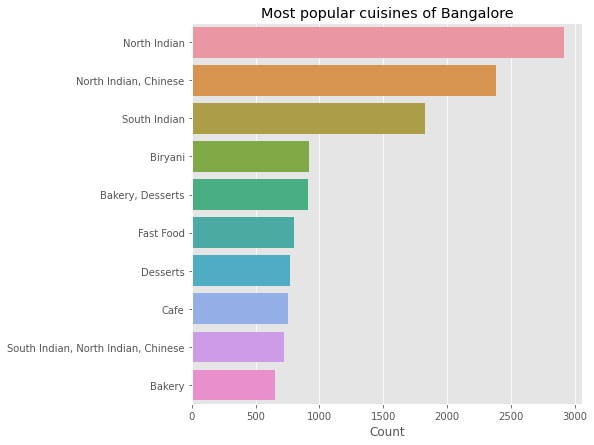

In [35]:
plt.figure(figsize=(7,7))
cuisines=df['cuisines'].value_counts()[:10]
sns.barplot(cuisines,cuisines.index)
plt.xlabel('Count')
plt.title("Most popular cuisines of Bangalore")

1. We can observe that **North Indian,chinese,South Indian and Biriyani** are most common.
2. Is this imply the fact that Banglore is more influenced by North Indian culture more than South?
- We will inspect further......

## [Heatmap of North Indian restaurants]()<a id="15"></a> <br>


In [0]:
def produce_data(col,name):
    data= pd.DataFrame(df[df[col]==name].groupby(['location'],as_index=False)['url'].agg('count'))
    data.columns=['Name','count']
    print(data.head())
    data=data.merge(locations,on="Name",how='left').dropna()
    data['lan'],data['lon']=zip(*data['geo_loc'].values)
    return data.drop(['geo_loc'],axis=1)



In [37]:
North_India=produce_data('cuisines','North Indian')

                Name  count
0                BTM    340
1       Banashankari     36
2          Banaswadi     12
3  Bannerghatta Road     75
4       Basavanagudi     21


In [38]:
basemap=generateBaseMap()
HeatMap(North_India[['lan','lon','count']].values.tolist(),max_zoom=20,radius=15).add_to(basemap)
basemap

1. Interesting to see a cluster of North Indian Restaurants in South Bangalore area !
2. This may indicate that these areas are more populated by North Indians.

## [What about South  Indian cuisines?]()<a id="16"></a> <br>


In [39]:
food=produce_data('cuisines','South Indian')
basemap=generateBaseMap()
HeatMap(food[['lan','lon','count']].values.tolist(),max_zoom=20,radius=15).add_to(basemap)
basemap

                Name  count
0                BTM    113
1       Banashankari     86
2          Banaswadi     37
3  Bannerghatta Road     48
4       Basavanagudi     89


1. They tend to span all over Bangalore.
2. South Indian cuisines tend to cluster near central Bangalore.

## [Analysing Restaurant chains]()<a id="17"></a> <br>
 

In [0]:
def produce_chains(name):
    data_chain=pd.DataFrame(df[df["name"]==name]['location'].value_counts().reset_index())
    data_chain.columns=['Name','count']
    data_chain=data_chain.merge(locations,on="Name",how="left").dropna()
    data_chain['lan'],data_chain['lon']=zip(*data_chain['geo_loc'].values)
    return data_chain[['Name','count','lan','lon']]


In [0]:
df_1=df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})


In [0]:
mapbox_access_token="pk.eyJ1Ijoic2hhaHVsZXMiLCJhIjoiY2p4ZTE5NGloMDc2YjNyczBhcDBnZnA5aCJ9.psBECQ2nub0o25PgHcU88w"


## [Which are the most popular casual dining restaurant chains?]()<a id="18"></a> <br>


In [43]:
casual=datas[datas['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
59,27,Casual Dining,Empire Restaurant,58
60,27,Casual Dining,Beijing Bites,48
61,27,Casual Dining,Mani's Dum Biryani,47


- We can see tht **Empire restaurant,Beijing bites and Mani's dum biriyani** are the most popular casual dining restaurant chains in Bangalore.
- We will inspect them further...

## [Where are their outlets located?]()<a id="19"></a> <br>


In [0]:
def produce_trace(data_chain,name):
        data_chain['text']=data_chain['Name']+'<br>'+data_chain['count'].astype(str)
        trace =  go.Scattermapbox(
           
                lat=data_chain['lan'],
                lon=data_chain['lon'],
                mode='markers',
                marker=go.scattermapbox.Marker(
                    size=data_chain['count']*4
                ),
                text=data_chain['text'],name=name
            )
        
        return trace

In [45]:
configure_plotly_browser_state()
data=[] 
for row in casual['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Casual Dining Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

1. We can see that **Mani's dum biriyani** restaurant has half of their restaurants in central Banglore.
2. ** Empire Restaurant** is present in all over Banglore.
3. **Mani's dum Biriyani** has 12 outlets in ulsoor,which is the most in a single location.

## [Top quick bites restaurant chains in Banglore]()<a id="20"></a> <br>


In [46]:
quick=datas[datas['rest_type']=='Quick Bites']
quick 

,level_0,rest_type,name,count
179,78,Quick Bites,Five Star Chicken,69
180,78,Quick Bites,Domino's Pizza,60
181,78,Quick Bites,McDonald's,59


- Surprisingly  ** Five star chicken** dominates in quick bites restaurant types overtaking famous **Domino's Pizza and McDonald's**.
- Five Star Chicken is a branch of Charoen Pokphand Group Foods, a Thai multinational conglomerate with over $12 billion business in Agro and Food       Industries. Five Star Chicken specialties in fried chicken.

## [Where are their outlets located?]()<a id="21"></a> <br>


In [47]:
configure_plotly_browser_state()
data=[]  
for row in quick['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Quick Bites Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## [Top Cafes of Banglore?]()<a id="22"></a> <br>


In [48]:
cafe=datas[datas['rest_type']=='Cafe']
cafe

,level_0,rest_type,name,count
41,19,Cafe,Cafe Coffee Day,96
42,19,Cafe,Smally's Resto Cafe,54
43,19,Cafe,Mudpipe Cafe,39


- No surprises,Cafe coffee day restaurant dominated way over other cafe chains in Banglore.
- Cafe coffee day has 96 outlets in Banglore.
- Café Coffee Day was started as a retail restaurant in 1996. The first CCD outlet was set up on July 11, 1996, at Brigade Road, Bengaluru, Karnataka.


## [Where are their outlets located?]()<a id="23"></a> <br>


In [49]:
configure_plotly_browser_state()
data=[]  
for row in cafe['name']:
    data_chain=produce_chains(row) 
    trace_0=produce_trace(data_chain,row)
    data.append(trace_0)



layout = go.Layout(title="Cafe Restaurant chains locations around Banglore",
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,style="streets",
        center=dict(
            lat=12.96,
            lon=77.59
        ),
        pitch=0,
        zoom=10
    ),
)


fig = dict(data=data, layout=layout)
py.iplot(fig, filename='Montreal Mapbox')

## [Wordcloud of dishes liked by cuisines.]()<a id="24"></a> <br>


In [0]:
df['dish_liked']=df['dish_liked'].apply(lambda x : x.split(',') if type(x)==str else [''])
#x=df.groupby('rest_type',as_index=False)['dish_liked'].agg('sum')
#x['dish_liked']=x['dish_liked'].apply(lambda x : list(filter(lambda a : a!='',x)))

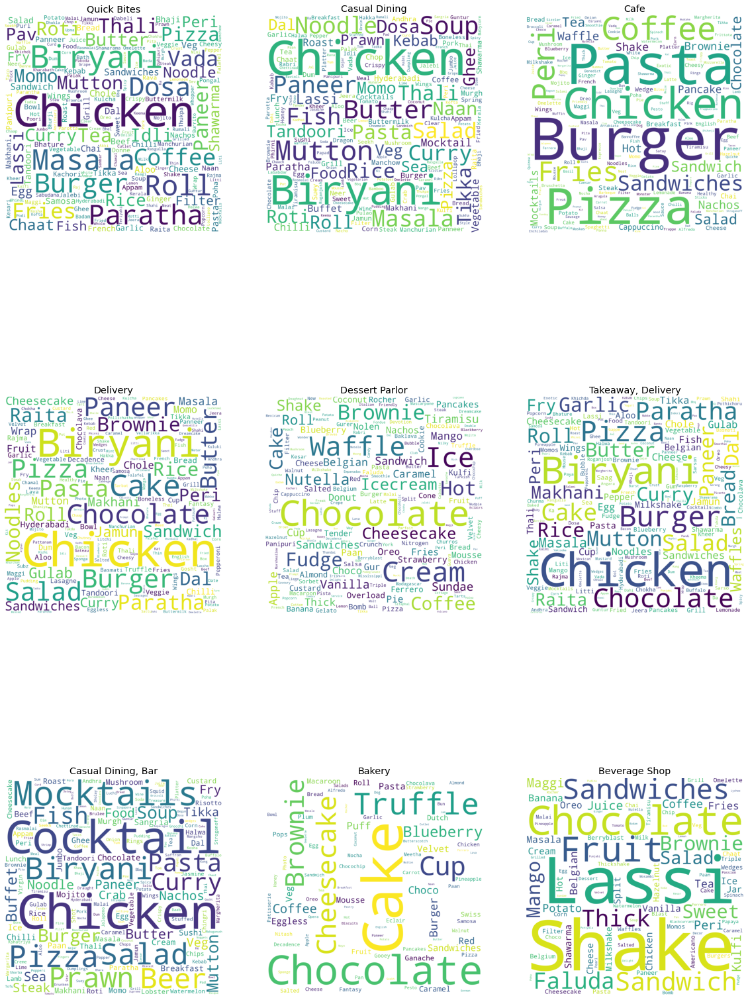

In [51]:
rest=df['rest_type'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=df[df['rest_type']==r]['dish_liked'].values.tolist()
        corpus=','.join(x  for list_words in corpus for x in list_words)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## [Analysing Reviews]()<a id="26"></a><br>

- In this section we will go on to prepare reviews dataframe.
- We will extract reviews and ratings of each restaurant and create a dataframe with it.


In [52]:
all_ratings = []

for name,ratings in tqdm(zip(df['name'],df['reviews_list'])):
    ratings = eval(ratings)
    for score, doc in ratings:
        if score:
            score = score.strip("Rated").strip()
            doc = doc.strip('RATED').strip()
            score = float(score)
            all_ratings.append([name,score, doc])

51717it [00:18, 2851.87it/s]


In [0]:
rating_df=pd.DataFrame(all_ratings,columns=['name','rating','review'])
rating_df['review']=rating_df['review'].apply(lambda x : re.sub('[^a-zA-Z0-9\s]',"",x))

In [0]:
rating_df.to_csv("Ratings.csv")

In [55]:
rating_df.head()

,name,rating,review
0,Jalsa,4.0,A beautiful place to dine inThe interiors take...
1,Jalsa,4.0,I was here for dinner with my family on a week...
2,Jalsa,2.0,Its a restaurant near to Banashankari BDA Me a...
3,Jalsa,4.0,We went here on a weekend and one of us had th...
4,Jalsa,5.0,The best thing about the place is its ambiance...


## [WordCloud of Reviews of restaurant chains]()<a id="27"></a><br>

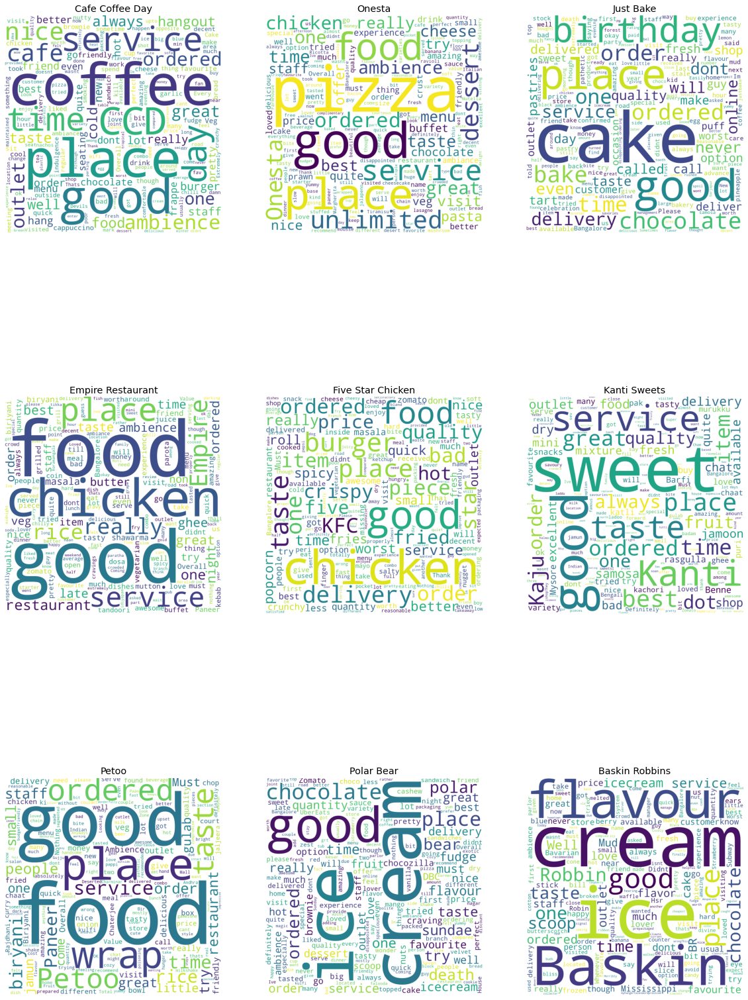

In [56]:
rest=df['name'].value_counts()[:9].index
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,r in enumerate(rest):
        plt.subplot(3,3,i+1)
        corpus=rating_df[rating_df['name']==r]['review'].values.tolist()
        corpus=' '.join(x  for x in corpus)
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,
                      width=1500, height=1500).generate(corpus)
        plt.imshow(wordcloud)
        plt.title(r)
        plt.axis("off")
        

        
        
produce_wordcloud(rest)

## [Rating distribution]()<a id="28" ></a><br>

Text(0, 0.5, 'count')

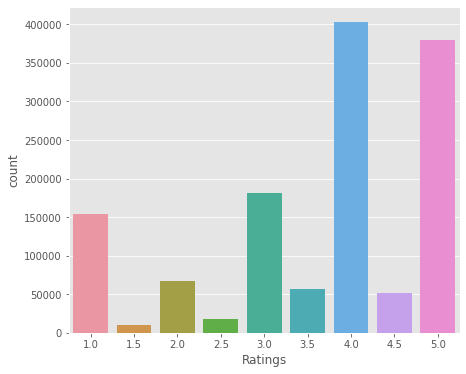

In [57]:
plt.figure(figsize=(7,6))
rating=rating_df['rating'].value_counts()
sns.barplot(x=rating.index,y=rating)
plt.xlabel("Ratings")
plt.ylabel('count')